In [2]:
!pip install umap-learn

  Created wheel for umap-learn: filename=umap_learn-0.5.0-py3-none-any.whl size=76338 sha256=d29a813706256748f86df00bec8b816125ae4bf307acee9d605d8fb912dceaf0
  Stored in directory: c:\users\vincent\appdata\local\pip\cache\wheels\ae\d7\10\0b474d56359c3caf8472e626dd0fd2dcc33d7a011f0458ac7d
  Created wheel for pynndescent: filename=pynndescent-0.5.1-py3-none-any.whl size=48610 sha256=76bf9b075773fb4d79f9be7ea454ebcf5cff34328730e0e400134fdc9ecfc33c
  Stored in directory: c:\users\vincent\appdata\local\pip\cache\wheels\e5\21\ae\4860d52fcf914e4fada06cd3dcc917efcc903d26250753f47f
Successfully built umap-learn pynndescent


You should consider upgrading via the 'b:\program files\phthon\python.exe -m pip install --upgrade pip' command.


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.datasets import fetch_openml
import umap

In [4]:
#load the MNIST dataset
mnist = fetch_openml('mnist_784', version=1, cache=True)

In [5]:
np.random.seed(42)
indices = np.random.choice(70000,10000)
X = mnist.data[indices] / 255.0
y = mnist.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


In [7]:
#test UMAP with 5 neighbors

time_start = time.time()
umap_results = umap.UMAP(n_neighbors=5,
                        min_dist=0.3,
                        metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 6.188975095748901 seconds


In [12]:
#we then plot the representations from UMAP, color and label each data points according to its true digit

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i,0], umap_results[i,1], y[i], color=colours[int(y[i])], fontdict={'weight': 'bold', 'size': 50})
    
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [14]:
#visualization with t-SNE
from sklearn.manifold import TSNE

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 2.681s...
[t-SNE] Computed neighbors for 10000 samples in 103.537s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.182469
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.700996
[t-SNE] KL divergence after 300 iterations: 2.795747
t-SNE done! Time elapse

In [15]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### The t-SNE takes about 20 times more time than UMAP, while showing a clustering result that is not as good as the UMAP result

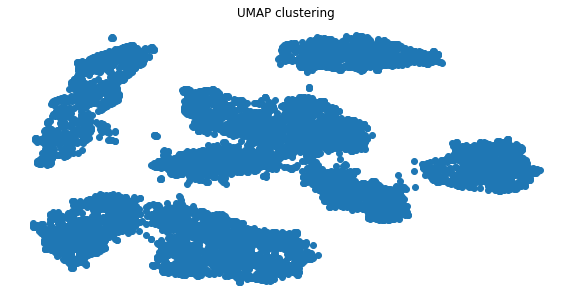

In [16]:
#In cases we don't have the labeled data, let's see how well its separats the clusters.
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title('UMAP clustering')
plt.show()

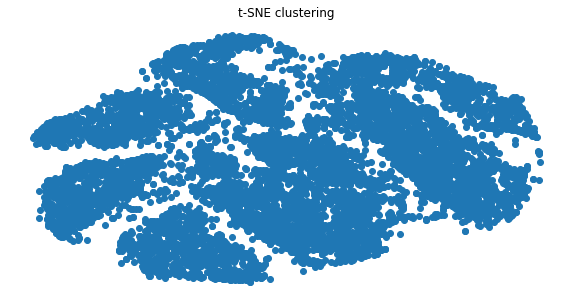

In [17]:
plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title('t-SNE clustering')
plt.show()

### By comparing the clustering results between the UMAP and t-SNE, we can also draw similar conclusion that the UMAP separates cluters better than t-SNE based on this test.